In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_excel('data.xlsx')

In [3]:
df.head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_2039,feature_2040,feature_2041,feature_2042,feature_2043,feature_2044,feature_2045,feature_2046,feature_2047,label
0,0.142170,0.270658,0.172161,0.128419,0.162705,0.011624,0.282096,0.167847,0.012499,0.129094,...,0.034066,0.024912,0.030153,0.323926,0.066432,0.026572,0.165336,0.000000,0.174000,1
1,0.128376,0.248993,0.260346,0.045832,0.206410,0.046443,0.303825,0.147024,0.009290,0.239436,...,0.005309,0.114345,0.090300,0.247387,0.074784,0.017010,0.118286,0.001307,0.218108,0
2,0.237904,0.350561,0.147295,0.065817,0.153813,0.233031,0.158886,0.029988,0.014327,0.222089,...,0.000000,0.007023,0.097333,0.153080,0.043310,0.022119,0.134147,0.004047,0.105774,1
3,0.177536,0.213367,0.180853,0.128782,0.198366,0.000082,0.240751,0.033086,0.009554,0.177033,...,0.001733,0.086853,0.038954,0.141771,0.044282,0.047918,0.172786,0.000000,0.093998,2
4,0.122600,0.170360,0.142664,0.013108,0.158516,0.000460,0.200634,0.000000,0.000000,0.100740,...,0.008589,0.114697,0.065512,0.139558,0.072949,0.002684,0.104563,0.115294,0.107360,0


In [4]:
X = df.iloc[:,:-1]  # all the features
y = df.iloc[:,-1]   # the label columns

# Data Exploration

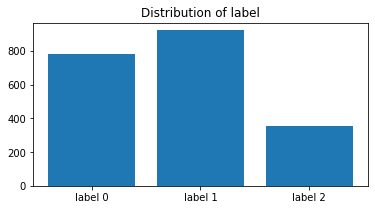

In [5]:
# Check for distribution of labels
label0 = df['label'].loc[df['label']==0].count()
label1 = df['label'].loc[df['label']==1].count()
label2 = df['label'].loc[df['label']==2].count()
plt.figure(figsize=(6,3))
plt.bar(range(3),[label0,label1,label2])
plt.title('Distribution of label')
plt.xticks(range(3),['label 0','label 1','label 2'])
plt.savefig("Data_distribution.png")
plt.show()

# Correlation between features

In [115]:
corr_X = X.corr().abs()

In [116]:
corr_X

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_2038,feature_2039,feature_2040,feature_2041,feature_2042,feature_2043,feature_2044,feature_2045,feature_2046,feature_2047
feature_0,1.000000,0.388492,0.439489,0.475231,0.306585,0.448595,0.208842,0.470005,0.468218,0.395924,...,0.340494,0.469296,0.471401,0.467232,0.062959,0.459198,0.455574,0.177986,0.470466,0.410795
feature_1,0.388492,1.000000,0.538374,0.562853,0.520178,0.516752,0.182800,0.559251,0.558946,0.339870,...,0.445507,0.557848,0.563132,0.548261,0.101924,0.544359,0.552518,0.338561,0.559743,0.531140
feature_2,0.439489,0.538374,1.000000,0.862038,0.812022,0.886564,0.531841,0.907293,0.891581,0.403228,...,0.901525,0.890354,0.882546,0.884938,0.455656,0.958325,0.889700,0.526264,0.890252,0.965577
feature_3,0.475231,0.562853,0.862038,1.000000,0.763761,0.975460,0.351202,0.980165,0.982751,0.418995,...,0.677096,0.983961,0.979614,0.978633,0.253344,0.932170,0.981092,0.519229,0.982793,0.862425
feature_4,0.306585,0.520178,0.812022,0.763761,1.000000,0.764766,0.357781,0.775723,0.771505,0.391664,...,0.774873,0.771561,0.757808,0.764891,0.278393,0.799203,0.767898,0.461911,0.771182,0.802399
feature_5,0.448595,0.516752,0.886564,0.975460,0.764766,1.000000,0.348899,0.993119,0.995363,0.400678,...,0.710931,0.994460,0.991834,0.992397,0.264433,0.953243,0.994005,0.544703,0.995077,0.888585
feature_6,0.208842,0.182800,0.531841,0.351202,0.357781,0.348899,1.000000,0.390878,0.356997,0.204513,...,0.446084,0.362775,0.349752,0.349794,0.504914,0.474634,0.361282,0.209994,0.354929,0.581071
feature_7,0.470005,0.559251,0.907293,0.980165,0.775723,0.993119,0.390878,1.000000,0.997684,0.430628,...,0.731394,0.997457,0.994268,0.993475,0.300020,0.966926,0.996278,0.546913,0.997299,0.912068
feature_8,0.468218,0.558946,0.891581,0.982751,0.771505,0.995363,0.356997,0.997684,1.000000,0.422279,...,0.712272,0.999472,0.997242,0.996531,0.264106,0.957461,0.998287,0.541816,0.999639,0.891515
feature_9,0.395924,0.339870,0.403228,0.418995,0.391664,0.400678,0.204513,0.430628,0.422279,1.000000,...,0.349467,0.422406,0.420301,0.409487,0.195275,0.428888,0.407071,0.219663,0.423708,0.459913


In [121]:
# return the total number of cells with corrleation greater than 0.9
no = 0
for column in range(0, len(corr_X)):
    for row in range(0, len(corr_X)):
        if(corr_X.iloc[row,column]>0.9):
            no+=1
no

1032990

In [123]:
# total number of cells
total_no = (len(corr_X)**2)

In [126]:
# Return the percentage of cells with correlation greater than 0.9
(no-len(corr_X))/(total_no - len(corr_X))

0.24591580285173426

# Data Cleaning

In [6]:
# Check and remove outliers
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
upper_outliers = df>Q3+1.5*IQR
lower_outliers = df<Q1-1.5*IQR
outlier_records = df[(upper_outliers|lower_outliers).any(axis=1)]
outlier_records

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_2039,feature_2040,feature_2041,feature_2042,feature_2043,feature_2044,feature_2045,feature_2046,feature_2047,label
0,0.142170,0.270658,0.172161,0.128419,0.162705,0.011624,0.282096,0.167847,0.012499,0.129094,...,0.034066,0.024912,0.030153,0.323926,0.066432,0.026572,0.165336,0.000000,0.174000,1
1,0.128376,0.248993,0.260346,0.045832,0.206410,0.046443,0.303825,0.147024,0.009290,0.239436,...,0.005309,0.114345,0.090300,0.247387,0.074784,0.017010,0.118286,0.001307,0.218108,0
2,0.237904,0.350561,0.147295,0.065817,0.153813,0.233031,0.158886,0.029988,0.014327,0.222089,...,0.000000,0.007023,0.097333,0.153080,0.043310,0.022119,0.134147,0.004047,0.105774,1
3,0.177536,0.213367,0.180853,0.128782,0.198366,0.000082,0.240751,0.033086,0.009554,0.177033,...,0.001733,0.086853,0.038954,0.141771,0.044282,0.047918,0.172786,0.000000,0.093998,2
4,0.122600,0.170360,0.142664,0.013108,0.158516,0.000460,0.200634,0.000000,0.000000,0.100740,...,0.008589,0.114697,0.065512,0.139558,0.072949,0.002684,0.104563,0.115294,0.107360,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2055,0.109725,0.265218,0.144077,0.135370,0.177199,0.017577,0.210776,0.033806,0.004462,0.215895,...,0.029784,0.025734,0.000964,0.163569,0.041267,0.009942,0.167246,0.011447,0.100860,1
2056,0.067200,0.120026,0.570559,1.287342,0.543818,2.239457,0.318077,2.584087,2.571561,0.081878,...,2.626504,1.469146,1.556837,0.240278,0.301351,1.921648,0.073722,2.662152,0.481986,0
2057,0.183457,0.199015,0.152847,0.065745,0.199075,0.027014,0.164962,0.036789,0.007006,0.152075,...,0.010325,0.053566,0.022623,0.150262,0.040704,0.020757,0.155347,0.004512,0.104068,0
2058,0.179354,0.290474,0.138822,0.052485,0.193973,0.092140,0.203857,0.067250,0.010154,0.241023,...,0.043632,0.045749,0.025473,0.185568,0.056012,0.024917,0.137798,0.008244,0.094897,0


In [7]:
# The number of records with outliers
len(outlier_records)

2056

In [8]:
# Check the number of records containing missing values
df.isna().sum().sum()

0

In [105]:
# Check duplicated rows
df[df.duplicated()]

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_2039,feature_2040,feature_2041,feature_2042,feature_2043,feature_2044,feature_2045,feature_2046,feature_2047,label
50,0.067200,0.120026,0.570559,1.287342,0.543818,2.239457,0.318077,2.584087,2.571561,0.081878,...,2.626504,1.469146,1.556837,0.240278,0.301351,1.921648,0.073722,2.662152,0.481986,0
67,0.067200,0.120026,0.570559,1.287342,0.543818,2.239457,0.318077,2.584087,2.571561,0.081878,...,2.626504,1.469146,1.556837,0.240278,0.301351,1.921648,0.073722,2.662152,0.481986,0
90,0.067200,0.120026,0.570559,1.287342,0.543818,2.239457,0.318077,2.584087,2.571561,0.081878,...,2.626504,1.469146,1.556837,0.240278,0.301351,1.921648,0.073722,2.662152,0.481986,0
96,0.067200,0.120026,0.570559,1.287342,0.543818,2.239457,0.318077,2.584087,2.571561,0.081878,...,2.626504,1.469146,1.556837,0.240278,0.301351,1.921648,0.073722,2.662152,0.481986,0
98,0.067200,0.120026,0.570559,1.287342,0.543818,2.239457,0.318077,2.584087,2.571561,0.081878,...,2.626504,1.469146,1.556837,0.240278,0.301351,1.921648,0.073722,2.662152,0.481986,0
126,0.067200,0.120026,0.570559,1.287342,0.543818,2.239457,0.318077,2.584087,2.571561,0.081878,...,2.626504,1.469146,1.556837,0.240278,0.301351,1.921648,0.073722,2.662152,0.481986,0
128,0.067200,0.120026,0.570559,1.287342,0.543818,2.239457,0.318077,2.584087,2.571561,0.081878,...,2.626504,1.469146,1.556837,0.240278,0.301351,1.921648,0.073722,2.662152,0.481986,0
162,0.067200,0.120026,0.570559,1.287342,0.543818,2.239457,0.318077,2.584087,2.571561,0.081878,...,2.626504,1.469146,1.556837,0.240278,0.301351,1.921648,0.073722,2.662152,0.481986,0
173,0.067200,0.120026,0.570559,1.287342,0.543818,2.239457,0.318077,2.584087,2.571561,0.081878,...,2.626504,1.469146,1.556837,0.240278,0.301351,1.921648,0.073722,2.662152,0.481986,0
187,0.067200,0.120026,0.570559,1.287342,0.543818,2.239457,0.318077,2.584087,2.571561,0.081878,...,2.626504,1.469146,1.556837,0.240278,0.301351,1.921648,0.073722,2.662152,0.481986,0


# Feature Selection (Perform PCA)

In [11]:
from sklearn.decomposition import PCA
from sklearn import preprocessing

In [12]:
X_scaled = pd.DataFrame()
for column in X.columns:
    X_scaled[column] = preprocessing.scale(X[column])
X_scaled

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_2038,feature_2039,feature_2040,feature_2041,feature_2042,feature_2043,feature_2044,feature_2045,feature_2046,feature_2047
0,-0.311694,0.003057,-0.291778,-0.229281,-0.657650,-0.366142,0.574207,-0.142385,-0.302559,-0.876102,...,-0.630222,-0.286614,-0.331101,-0.346075,2.369103,-0.161798,-0.318950,0.501956,-0.326097,0.109765
1,-0.540987,-0.262557,0.422490,-0.477846,-0.291861,-0.308909,0.924952,-0.172071,-0.307091,0.346655,...,0.496566,-0.326517,-0.105940,-0.202395,0.975924,-0.043651,-0.337245,-0.676040,-0.324310,0.514788
2,1.279649,0.982661,-0.493185,-0.417697,-0.732071,-0.002209,-1.414534,-0.338921,-0.299976,0.154432,...,-0.356022,-0.333884,-0.376140,-0.185593,-0.740682,-0.488914,-0.327471,-0.278926,-0.320567,-0.516720
3,0.276186,-0.699322,-0.221372,-0.228188,-0.359185,-0.385113,-0.093135,-0.334504,-0.306718,-0.344859,...,-0.455112,-0.331479,-0.175154,-0.325051,-0.946529,-0.475155,-0.278110,0.688498,-0.326097,-0.624852
4,-0.636990,-1.226585,-0.530693,-0.576339,-0.692708,-0.384492,-0.740673,-0.381673,-0.320213,-1.190308,...,-0.623777,-0.321967,-0.105054,-0.261608,-0.986804,-0.069598,-0.364654,-1.019638,-0.168585,-0.502152
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2055,-0.851008,-0.063635,-0.519245,-0.208359,-0.536347,-0.356356,-0.576968,-0.333478,-0.313911,0.085793,...,-0.702868,-0.292556,-0.329031,-0.415804,-0.549759,-0.517810,-0.350767,0.549780,-0.310458,-0.561839
2056,-1.557867,-1.843667,2.935099,3.258794,2.532058,3.295820,1.154994,3.302285,3.312010,-1.399323,...,2.326530,3.310633,3.304982,3.300944,0.846524,3.161603,3.306792,-1.791817,3.310855,2.937837
2057,0.374597,-0.875275,-0.448217,-0.417913,-0.353253,-0.340844,-1.316465,-0.329225,-0.310317,-0.621440,...,-0.342442,-0.319557,-0.258960,-0.364064,-0.791984,-0.525779,-0.330077,0.251867,-0.319932,-0.532379
2058,0.306408,0.246004,-0.561812,-0.457823,-0.395955,-0.233796,-0.688656,-0.285799,-0.305871,0.364247,...,-0.654768,-0.273341,-0.278642,-0.357256,-0.149330,-0.309216,-0.322118,-0.187511,-0.314835,-0.616599


In [13]:
pca = PCA(n_components=len(X_scaled.columns))
pca.fit(X_scaled)
temp_df = pca.transform(X_scaled)

In [14]:
cum_variance = pd.DataFrame(pca.explained_variance_ratio_.cumsum(),columns=['PCA'])

In [15]:
# the smallest number of features for the proportion of explained variance to be 0.9
smallest_no = 1
target_cumvariance = 0.9
for value in cum_variance['PCA']:
    if value < target_cumvariance:
        smallest_no+=1
smallest_no  

39

In [16]:
final_pca = PCA(n_components=smallest_no)
final_pca.fit(X_scaled)
X_scaled = final_pca.transform(X_scaled)
X_scaled = pd.DataFrame(X_scaled)

# Decision Tree with Standard Parameters

In [17]:
from sklearn.model_selection import KFold, StratifiedKFold, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import make_scorer, f1_score
from sklearn.pipeline import Pipeline

In [18]:
s_kfold = StratifiedKFold(n_splits=10)
dtree = DecisionTreeClassifier()
cross_validation_score = cross_val_score(dtree,X_scaled,y,cv=s_kfold,scoring=make_scorer(f1_score,average='weighted'))

In [19]:
# the mean of f1 weighted score under standard parameters
cross_validation_score.mean()

0.7637398507008483

# Hyperparameters tunning for Decision Trees

In [20]:
# hyperparameter tunning
from sklearn.model_selection import GridSearchCV
criterion = ['gini','entropy']
max_depth = list(range(1,smallest_no+1))

In [21]:
dtree_after_gridsearch = GridSearchCV(dtree,{'criterion':criterion,'max_depth':max_depth},
                                      cv=s_kfold,
                                      scoring=make_scorer(f1_score,average='weighted'))

In [22]:
dtree_after_gridsearch.fit(X_scaled,y)

GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=None,
    

In [23]:
dtree_after_gridsearch.best_params_

{'criterion': 'gini', 'max_depth': 8}

In [24]:
dtree_after_gridsearch.best_score_

0.7952625585814417

# Ensemble method: Random Forest with Standard parameters

In [25]:
from sklearn.ensemble import RandomForestClassifier

In [26]:
cross_validation_score_for_random_forest = cross_val_score(RandomForestClassifier(),
                                                           X_scaled,y,
                                                           cv=s_kfold,
                                                           scoring=make_scorer(f1_score,average='weighted'))

In [27]:
# the average Stratified 10-fold cross validation score
cross_validation_score_for_random_forest.mean()

0.9066676017654863

# Hyperparameter tunning for Random Forest

In [28]:
# hyperparameter tunning
criterion = ['gini','entropy']
max_depth = list(range(1,smallest_no+1))
n_estimators = [200,400,600,800,1000]

In [29]:
random_forest_after_gridsearch = GridSearchCV(RandomForestClassifier(),
                                              {'criterion':criterion,'max_depth':max_depth,'n_estimators':n_estimators},
                                             cv=s_kfold,scoring=make_scorer(f1_score,average='weighted'),verbose=2)

In [30]:
random_forest_after_gridsearch.fit(X_scaled,y)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits
[CV] criterion=gini, max_depth=1, n_estimators=200 ...................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] .... criterion=gini, max_depth=1, n_estimators=200, total=   0.4s
[CV] criterion=gini, max_depth=1, n_estimators=200 ...................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.4s remaining:    0.0s


[CV] .... criterion=gini, max_depth=1, n_estimators=200, total=   0.4s
[CV] criterion=gini, max_depth=1, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=1, n_estimators=200, total=   0.4s
[CV] criterion=gini, max_depth=1, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=1, n_estimators=200, total=   0.3s
[CV] criterion=gini, max_depth=1, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=1, n_estimators=200, total=   0.4s
[CV] criterion=gini, max_depth=1, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=1, n_estimators=200, total=   0.3s
[CV] criterion=gini, max_depth=1, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=1, n_estimators=200, total=   0.4s
[CV] criterion=gini, max_depth=1, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=1, n_estimators=200, total=   0.4s
[CV] criterion=gini, max_depth=1, n_estimators=200 ...................
[CV] .

[CV] .... criterion=gini, max_depth=2, n_estimators=200, total=   0.4s
[CV] criterion=gini, max_depth=2, n_estimators=400 ...................
[CV] .... criterion=gini, max_depth=2, n_estimators=400, total=   0.9s
[CV] criterion=gini, max_depth=2, n_estimators=400 ...................
[CV] .... criterion=gini, max_depth=2, n_estimators=400, total=   0.9s
[CV] criterion=gini, max_depth=2, n_estimators=400 ...................
[CV] .... criterion=gini, max_depth=2, n_estimators=400, total=   0.9s
[CV] criterion=gini, max_depth=2, n_estimators=400 ...................
[CV] .... criterion=gini, max_depth=2, n_estimators=400, total=   0.9s
[CV] criterion=gini, max_depth=2, n_estimators=400 ...................
[CV] .... criterion=gini, max_depth=2, n_estimators=400, total=   0.9s
[CV] criterion=gini, max_depth=2, n_estimators=400 ...................
[CV] .... criterion=gini, max_depth=2, n_estimators=400, total=   0.9s
[CV] criterion=gini, max_depth=2, n_estimators=400 ...................
[CV] .

[CV] .... criterion=gini, max_depth=3, n_estimators=400, total=   1.1s
[CV] criterion=gini, max_depth=3, n_estimators=400 ...................
[CV] .... criterion=gini, max_depth=3, n_estimators=400, total=   1.0s
[CV] criterion=gini, max_depth=3, n_estimators=400 ...................
[CV] .... criterion=gini, max_depth=3, n_estimators=400, total=   1.1s
[CV] criterion=gini, max_depth=3, n_estimators=600 ...................
[CV] .... criterion=gini, max_depth=3, n_estimators=600, total=   1.6s
[CV] criterion=gini, max_depth=3, n_estimators=600 ...................
[CV] .... criterion=gini, max_depth=3, n_estimators=600, total=   1.7s
[CV] criterion=gini, max_depth=3, n_estimators=600 ...................
[CV] .... criterion=gini, max_depth=3, n_estimators=600, total=   1.6s
[CV] criterion=gini, max_depth=3, n_estimators=600 ...................
[CV] .... criterion=gini, max_depth=3, n_estimators=600, total=   1.6s
[CV] criterion=gini, max_depth=3, n_estimators=600 ...................
[CV] .

[CV] .... criterion=gini, max_depth=4, n_estimators=600, total=   1.8s
[CV] criterion=gini, max_depth=4, n_estimators=600 ...................
[CV] .... criterion=gini, max_depth=4, n_estimators=600, total=   1.8s
[CV] criterion=gini, max_depth=4, n_estimators=600 ...................
[CV] .... criterion=gini, max_depth=4, n_estimators=600, total=   1.8s
[CV] criterion=gini, max_depth=4, n_estimators=600 ...................
[CV] .... criterion=gini, max_depth=4, n_estimators=600, total=   1.9s
[CV] criterion=gini, max_depth=4, n_estimators=600 ...................
[CV] .... criterion=gini, max_depth=4, n_estimators=600, total=   1.8s
[CV] criterion=gini, max_depth=4, n_estimators=800 ...................
[CV] .... criterion=gini, max_depth=4, n_estimators=800, total=   2.4s
[CV] criterion=gini, max_depth=4, n_estimators=800 ...................
[CV] .... criterion=gini, max_depth=4, n_estimators=800, total=   2.5s
[CV] criterion=gini, max_depth=4, n_estimators=800 ...................
[CV] .

[CV] .... criterion=gini, max_depth=5, n_estimators=800, total=   3.1s
[CV] criterion=gini, max_depth=5, n_estimators=800 ...................
[CV] .... criterion=gini, max_depth=5, n_estimators=800, total=   3.3s
[CV] criterion=gini, max_depth=5, n_estimators=800 ...................
[CV] .... criterion=gini, max_depth=5, n_estimators=800, total=   3.4s
[CV] criterion=gini, max_depth=5, n_estimators=800 ...................
[CV] .... criterion=gini, max_depth=5, n_estimators=800, total=   3.2s
[CV] criterion=gini, max_depth=5, n_estimators=800 ...................
[CV] .... criterion=gini, max_depth=5, n_estimators=800, total=   3.2s
[CV] criterion=gini, max_depth=5, n_estimators=800 ...................
[CV] .... criterion=gini, max_depth=5, n_estimators=800, total=   3.1s
[CV] criterion=gini, max_depth=5, n_estimators=800 ...................
[CV] .... criterion=gini, max_depth=5, n_estimators=800, total=   3.2s
[CV] criterion=gini, max_depth=5, n_estimators=1000 ..................
[CV] .

[CV] ... criterion=gini, max_depth=6, n_estimators=1000, total=   3.9s
[CV] criterion=gini, max_depth=6, n_estimators=1000 ..................
[CV] ... criterion=gini, max_depth=6, n_estimators=1000, total=  51.5s
[CV] criterion=gini, max_depth=6, n_estimators=1000 ..................
[CV] ... criterion=gini, max_depth=6, n_estimators=1000, total=   4.2s
[CV] criterion=gini, max_depth=6, n_estimators=1000 ..................
[CV] ... criterion=gini, max_depth=6, n_estimators=1000, total=  16.2s
[CV] criterion=gini, max_depth=6, n_estimators=1000 ..................
[CV] ... criterion=gini, max_depth=6, n_estimators=1000, total=  13.1s
[CV] criterion=gini, max_depth=6, n_estimators=1000 ..................
[CV] ... criterion=gini, max_depth=6, n_estimators=1000, total=   4.0s
[CV] criterion=gini, max_depth=6, n_estimators=1000 ..................
[CV] ... criterion=gini, max_depth=6, n_estimators=1000, total= 8.4min
[CV] criterion=gini, max_depth=6, n_estimators=1000 ..................
[CV] .

[CV] ... criterion=gini, max_depth=7, n_estimators=1000, total=   4.6s
[CV] criterion=gini, max_depth=8, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=8, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=8, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=8, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=8, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=8, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=8, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=8, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=8, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=8, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=8, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=8, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=8, n_estimators=200 ...................
[CV] .

[CV] .... criterion=gini, max_depth=9, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=9, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=9, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=9, n_estimators=200 ...................
[CV] .... criterion=gini, max_depth=9, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=9, n_estimators=400 ...................
[CV] .... criterion=gini, max_depth=9, n_estimators=400, total=   1.9s
[CV] criterion=gini, max_depth=9, n_estimators=400 ...................
[CV] .... criterion=gini, max_depth=9, n_estimators=400, total=   2.1s
[CV] criterion=gini, max_depth=9, n_estimators=400 ...................
[CV] .... criterion=gini, max_depth=9, n_estimators=400, total=   2.0s
[CV] criterion=gini, max_depth=9, n_estimators=400 ...................
[CV] .... criterion=gini, max_depth=9, n_estimators=400, total=   2.0s
[CV] criterion=gini, max_depth=9, n_estimators=400 ...................
[CV] .

[CV] ... criterion=gini, max_depth=10, n_estimators=400, total=   2.2s
[CV] criterion=gini, max_depth=10, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=10, n_estimators=400, total=   2.1s
[CV] criterion=gini, max_depth=10, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=10, n_estimators=400, total=   2.1s
[CV] criterion=gini, max_depth=10, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=10, n_estimators=400, total=   2.0s
[CV] criterion=gini, max_depth=10, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=10, n_estimators=400, total=   2.1s
[CV] criterion=gini, max_depth=10, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=10, n_estimators=600, total=   3.0s
[CV] criterion=gini, max_depth=10, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=10, n_estimators=600, total=   2.9s
[CV] criterion=gini, max_depth=10, n_estimators=600 ..................
[CV] .

[CV] ... criterion=gini, max_depth=11, n_estimators=600, total=   3.1s
[CV] criterion=gini, max_depth=11, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=11, n_estimators=600, total=   3.2s
[CV] criterion=gini, max_depth=11, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=11, n_estimators=600, total=   3.1s
[CV] criterion=gini, max_depth=11, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=11, n_estimators=600, total=   3.0s
[CV] criterion=gini, max_depth=11, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=11, n_estimators=600, total=   3.2s
[CV] criterion=gini, max_depth=11, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=11, n_estimators=600, total=   3.1s
[CV] criterion=gini, max_depth=11, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=11, n_estimators=600, total=   3.0s
[CV] criterion=gini, max_depth=11, n_estimators=800 ..................
[CV] .

[CV] ... criterion=gini, max_depth=12, n_estimators=800, total=   4.3s
[CV] criterion=gini, max_depth=12, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=12, n_estimators=800, total=   4.2s
[CV] criterion=gini, max_depth=12, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=12, n_estimators=800, total=   4.2s
[CV] criterion=gini, max_depth=12, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=12, n_estimators=800, total=   4.1s
[CV] criterion=gini, max_depth=12, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=12, n_estimators=800, total=   4.2s
[CV] criterion=gini, max_depth=12, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=12, n_estimators=800, total=   4.5s
[CV] criterion=gini, max_depth=12, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=12, n_estimators=800, total=   4.4s
[CV] criterion=gini, max_depth=12, n_estimators=800 ..................
[CV] .

[CV] ... criterion=gini, max_depth=13, n_estimators=800, total=   4.3s
[CV] criterion=gini, max_depth=13, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=13, n_estimators=1000, total=   5.4s
[CV] criterion=gini, max_depth=13, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=13, n_estimators=1000, total=   5.2s
[CV] criterion=gini, max_depth=13, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=13, n_estimators=1000, total=   5.6s
[CV] criterion=gini, max_depth=13, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=13, n_estimators=1000, total=   5.0s
[CV] criterion=gini, max_depth=13, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=13, n_estimators=1000, total=   5.1s
[CV] criterion=gini, max_depth=13, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=13, n_estimators=1000, total=   5.3s
[CV] criterion=gini, max_depth=13, n_estimators=1000 .................
[CV] .

[CV] .. criterion=gini, max_depth=14, n_estimators=1000, total=   5.4s
[CV] criterion=gini, max_depth=14, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=14, n_estimators=1000, total=   5.2s
[CV] criterion=gini, max_depth=14, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=14, n_estimators=1000, total=   5.3s
[CV] criterion=gini, max_depth=15, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=15, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=15, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=15, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=15, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=15, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=15, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=15, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=15, n_estimators=200 ..................
[CV] .

[CV] ... criterion=gini, max_depth=16, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=16, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=16, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=16, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=16, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=16, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=16, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=16, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=16, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=16, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=16, n_estimators=400, total=   2.2s
[CV] criterion=gini, max_depth=16, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=16, n_estimators=400, total=   2.2s
[CV] criterion=gini, max_depth=16, n_estimators=400 ..................
[CV] .

[CV] ... criterion=gini, max_depth=17, n_estimators=400, total=   2.5s
[CV] criterion=gini, max_depth=17, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=17, n_estimators=400, total=   2.2s
[CV] criterion=gini, max_depth=17, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=17, n_estimators=400, total=   2.1s
[CV] criterion=gini, max_depth=17, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=17, n_estimators=400, total=   2.1s
[CV] criterion=gini, max_depth=17, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=17, n_estimators=400, total=   2.2s
[CV] criterion=gini, max_depth=17, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=17, n_estimators=400, total=   2.1s
[CV] criterion=gini, max_depth=17, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=17, n_estimators=400, total=   2.2s
[CV] criterion=gini, max_depth=17, n_estimators=600 ..................
[CV] .

[CV] ... criterion=gini, max_depth=18, n_estimators=600, total=   3.2s
[CV] criterion=gini, max_depth=18, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=18, n_estimators=600, total=   3.2s
[CV] criterion=gini, max_depth=18, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=18, n_estimators=600, total=   3.2s
[CV] criterion=gini, max_depth=18, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=18, n_estimators=600, total=   3.2s
[CV] criterion=gini, max_depth=18, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=18, n_estimators=600, total=   3.1s
[CV] criterion=gini, max_depth=18, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=18, n_estimators=600, total=   3.2s
[CV] criterion=gini, max_depth=18, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=18, n_estimators=600, total=   3.1s
[CV] criterion=gini, max_depth=18, n_estimators=600 ..................
[CV] .

[CV] ... criterion=gini, max_depth=19, n_estimators=600, total=   3.2s
[CV] criterion=gini, max_depth=19, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=19, n_estimators=800, total=   4.3s
[CV] criterion=gini, max_depth=19, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=19, n_estimators=800, total=   4.2s
[CV] criterion=gini, max_depth=19, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=19, n_estimators=800, total=   4.3s
[CV] criterion=gini, max_depth=19, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=19, n_estimators=800, total=   4.2s
[CV] criterion=gini, max_depth=19, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=19, n_estimators=800, total=   4.3s
[CV] criterion=gini, max_depth=19, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=19, n_estimators=800, total=   4.2s
[CV] criterion=gini, max_depth=19, n_estimators=800 ..................
[CV] .

[CV] ... criterion=gini, max_depth=20, n_estimators=800, total=   4.6s
[CV] criterion=gini, max_depth=20, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=20, n_estimators=800, total=   5.0s
[CV] criterion=gini, max_depth=20, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=20, n_estimators=800, total=   4.7s
[CV] criterion=gini, max_depth=20, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=20, n_estimators=1000, total=   6.3s
[CV] criterion=gini, max_depth=20, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=20, n_estimators=1000, total=   6.1s
[CV] criterion=gini, max_depth=20, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=20, n_estimators=1000, total=   6.6s
[CV] criterion=gini, max_depth=20, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=20, n_estimators=1000, total=   5.9s
[CV] criterion=gini, max_depth=20, n_estimators=1000 .................
[CV] .

[CV] .. criterion=gini, max_depth=21, n_estimators=1000, total=   6.1s
[CV] criterion=gini, max_depth=21, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=21, n_estimators=1000, total=   6.1s
[CV] criterion=gini, max_depth=21, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=21, n_estimators=1000, total=   6.0s
[CV] criterion=gini, max_depth=21, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=21, n_estimators=1000, total=   5.7s
[CV] criterion=gini, max_depth=21, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=21, n_estimators=1000, total=   5.9s
[CV] criterion=gini, max_depth=22, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=22, n_estimators=200, total=   1.2s
[CV] criterion=gini, max_depth=22, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=22, n_estimators=200, total=   1.2s
[CV] criterion=gini, max_depth=22, n_estimators=200 ..................
[CV] .

[CV] ... criterion=gini, max_depth=23, n_estimators=200, total=   1.3s
[CV] criterion=gini, max_depth=23, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=23, n_estimators=200, total=   1.2s
[CV] criterion=gini, max_depth=23, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=23, n_estimators=200, total=   1.3s
[CV] criterion=gini, max_depth=23, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=23, n_estimators=200, total=   1.2s
[CV] criterion=gini, max_depth=23, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=23, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=23, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=23, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=23, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=23, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=23, n_estimators=400 ..................
[CV] .

[CV] ... criterion=gini, max_depth=24, n_estimators=400, total=   2.3s
[CV] criterion=gini, max_depth=24, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=24, n_estimators=400, total=   2.1s
[CV] criterion=gini, max_depth=24, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=24, n_estimators=400, total=   2.5s
[CV] criterion=gini, max_depth=24, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=24, n_estimators=400, total=   2.4s
[CV] criterion=gini, max_depth=24, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=24, n_estimators=400, total=   2.3s
[CV] criterion=gini, max_depth=24, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=24, n_estimators=400, total=   2.3s
[CV] criterion=gini, max_depth=24, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=24, n_estimators=400, total=   2.2s
[CV] criterion=gini, max_depth=24, n_estimators=400 ..................
[CV] .

[CV] ... criterion=gini, max_depth=25, n_estimators=400, total=   2.7s
[CV] criterion=gini, max_depth=25, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=25, n_estimators=600, total=   4.2s
[CV] criterion=gini, max_depth=25, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=25, n_estimators=600, total=   3.7s
[CV] criterion=gini, max_depth=25, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=25, n_estimators=600, total=   3.7s
[CV] criterion=gini, max_depth=25, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=25, n_estimators=600, total=   3.8s
[CV] criterion=gini, max_depth=25, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=25, n_estimators=600, total=   3.6s
[CV] criterion=gini, max_depth=25, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=25, n_estimators=600, total=   3.9s
[CV] criterion=gini, max_depth=25, n_estimators=600 ..................
[CV] .

[CV] ... criterion=gini, max_depth=26, n_estimators=600, total=   3.3s
[CV] criterion=gini, max_depth=26, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=26, n_estimators=600, total=   3.3s
[CV] criterion=gini, max_depth=26, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=26, n_estimators=600, total=   3.3s
[CV] criterion=gini, max_depth=26, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=26, n_estimators=800, total=   4.2s
[CV] criterion=gini, max_depth=26, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=26, n_estimators=800, total=   4.4s
[CV] criterion=gini, max_depth=26, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=26, n_estimators=800, total=   4.2s
[CV] criterion=gini, max_depth=26, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=26, n_estimators=800, total=   4.5s
[CV] criterion=gini, max_depth=26, n_estimators=800 ..................
[CV] .

[CV] ... criterion=gini, max_depth=27, n_estimators=800, total=   4.4s
[CV] criterion=gini, max_depth=27, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=27, n_estimators=800, total=   4.4s
[CV] criterion=gini, max_depth=27, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=27, n_estimators=800, total=   4.2s
[CV] criterion=gini, max_depth=27, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=27, n_estimators=800, total=   4.2s
[CV] criterion=gini, max_depth=27, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=27, n_estimators=800, total=   4.3s
[CV] criterion=gini, max_depth=27, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=27, n_estimators=1000, total=   5.4s
[CV] criterion=gini, max_depth=27, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=27, n_estimators=1000, total=   5.3s
[CV] criterion=gini, max_depth=27, n_estimators=1000 .................
[CV] .

[CV] .. criterion=gini, max_depth=28, n_estimators=1000, total=   5.6s
[CV] criterion=gini, max_depth=28, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=28, n_estimators=1000, total=   5.4s
[CV] criterion=gini, max_depth=28, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=28, n_estimators=1000, total=   5.3s
[CV] criterion=gini, max_depth=28, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=28, n_estimators=1000, total=   5.6s
[CV] criterion=gini, max_depth=28, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=28, n_estimators=1000, total=   5.5s
[CV] criterion=gini, max_depth=28, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=28, n_estimators=1000, total=   5.5s
[CV] criterion=gini, max_depth=28, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=28, n_estimators=1000, total=   5.6s
[CV] criterion=gini, max_depth=29, n_estimators=200 ..................
[CV] .

[CV] ... criterion=gini, max_depth=30, n_estimators=200, total=   1.3s
[CV] criterion=gini, max_depth=30, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=30, n_estimators=200, total=   1.2s
[CV] criterion=gini, max_depth=30, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=30, n_estimators=200, total=   1.2s
[CV] criterion=gini, max_depth=30, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=30, n_estimators=200, total=   1.2s
[CV] criterion=gini, max_depth=30, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=30, n_estimators=200, total=   1.3s
[CV] criterion=gini, max_depth=30, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=30, n_estimators=200, total=   1.2s
[CV] criterion=gini, max_depth=30, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=30, n_estimators=200, total=   1.2s
[CV] criterion=gini, max_depth=30, n_estimators=200 ..................
[CV] .

[CV] ... criterion=gini, max_depth=31, n_estimators=200, total=   1.2s
[CV] criterion=gini, max_depth=31, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=31, n_estimators=400, total=   2.4s
[CV] criterion=gini, max_depth=31, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=31, n_estimators=400, total=   2.4s
[CV] criterion=gini, max_depth=31, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=31, n_estimators=400, total=   2.4s
[CV] criterion=gini, max_depth=31, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=31, n_estimators=400, total=   2.4s
[CV] criterion=gini, max_depth=31, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=31, n_estimators=400, total=   2.4s
[CV] criterion=gini, max_depth=31, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=31, n_estimators=400, total=   2.3s
[CV] criterion=gini, max_depth=31, n_estimators=400 ..................
[CV] .

[CV] ... criterion=gini, max_depth=32, n_estimators=400, total=   2.1s
[CV] criterion=gini, max_depth=32, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=32, n_estimators=400, total=   2.1s
[CV] criterion=gini, max_depth=32, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=32, n_estimators=400, total=   2.0s
[CV] criterion=gini, max_depth=32, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=32, n_estimators=600, total=   3.1s
[CV] criterion=gini, max_depth=32, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=32, n_estimators=600, total=   3.1s
[CV] criterion=gini, max_depth=32, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=32, n_estimators=600, total=   3.0s
[CV] criterion=gini, max_depth=32, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=32, n_estimators=600, total=   3.4s
[CV] criterion=gini, max_depth=32, n_estimators=600 ..................
[CV] .

[CV] ... criterion=gini, max_depth=33, n_estimators=600, total=   3.8s
[CV] criterion=gini, max_depth=33, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=33, n_estimators=600, total=   3.8s
[CV] criterion=gini, max_depth=33, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=33, n_estimators=600, total=   3.8s
[CV] criterion=gini, max_depth=33, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=33, n_estimators=600, total=   3.4s
[CV] criterion=gini, max_depth=33, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=33, n_estimators=600, total=   3.1s
[CV] criterion=gini, max_depth=33, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=33, n_estimators=800, total=   4.2s
[CV] criterion=gini, max_depth=33, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=33, n_estimators=800, total=   4.3s
[CV] criterion=gini, max_depth=33, n_estimators=800 ..................
[CV] .

[CV] ... criterion=gini, max_depth=34, n_estimators=800, total=   4.1s
[CV] criterion=gini, max_depth=34, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=34, n_estimators=800, total=   4.1s
[CV] criterion=gini, max_depth=34, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=34, n_estimators=800, total=   4.2s
[CV] criterion=gini, max_depth=34, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=34, n_estimators=800, total=   4.5s
[CV] criterion=gini, max_depth=34, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=34, n_estimators=800, total=   4.4s
[CV] criterion=gini, max_depth=34, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=34, n_estimators=800, total=   4.6s
[CV] criterion=gini, max_depth=34, n_estimators=800 ..................
[CV] ... criterion=gini, max_depth=34, n_estimators=800, total=   4.9s
[CV] criterion=gini, max_depth=34, n_estimators=1000 .................
[CV] .

[CV] .. criterion=gini, max_depth=35, n_estimators=1000, total=   5.6s
[CV] criterion=gini, max_depth=35, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=35, n_estimators=1000, total=   6.4s
[CV] criterion=gini, max_depth=35, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=35, n_estimators=1000, total=   6.4s
[CV] criterion=gini, max_depth=35, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=35, n_estimators=1000, total=   6.5s
[CV] criterion=gini, max_depth=35, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=35, n_estimators=1000, total=   7.0s
[CV] criterion=gini, max_depth=35, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=35, n_estimators=1000, total=   6.7s
[CV] criterion=gini, max_depth=35, n_estimators=1000 .................
[CV] .. criterion=gini, max_depth=35, n_estimators=1000, total=   6.7s
[CV] criterion=gini, max_depth=35, n_estimators=1000 .................
[CV] .

[CV] .. criterion=gini, max_depth=36, n_estimators=1000, total=   5.2s
[CV] criterion=gini, max_depth=37, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=37, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=37, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=37, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=37, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=37, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=37, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=37, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=37, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=37, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=37, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=37, n_estimators=200, total=   1.2s
[CV] criterion=gini, max_depth=37, n_estimators=200 ..................
[CV] .

[CV] ... criterion=gini, max_depth=38, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=38, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=38, n_estimators=200, total=   1.0s
[CV] criterion=gini, max_depth=38, n_estimators=200 ..................
[CV] ... criterion=gini, max_depth=38, n_estimators=200, total=   1.1s
[CV] criterion=gini, max_depth=38, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=38, n_estimators=400, total=   2.3s
[CV] criterion=gini, max_depth=38, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=38, n_estimators=400, total=   2.1s
[CV] criterion=gini, max_depth=38, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=38, n_estimators=400, total=   2.2s
[CV] criterion=gini, max_depth=38, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=38, n_estimators=400, total=   2.3s
[CV] criterion=gini, max_depth=38, n_estimators=400 ..................
[CV] .

[CV] ... criterion=gini, max_depth=39, n_estimators=400, total=   2.6s
[CV] criterion=gini, max_depth=39, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=39, n_estimators=400, total=   2.5s
[CV] criterion=gini, max_depth=39, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=39, n_estimators=400, total=   2.7s
[CV] criterion=gini, max_depth=39, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=39, n_estimators=400, total=   2.6s
[CV] criterion=gini, max_depth=39, n_estimators=400 ..................
[CV] ... criterion=gini, max_depth=39, n_estimators=400, total=   2.5s
[CV] criterion=gini, max_depth=39, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=39, n_estimators=600, total=   3.9s
[CV] criterion=gini, max_depth=39, n_estimators=600 ..................
[CV] ... criterion=gini, max_depth=39, n_estimators=600, total=   4.0s
[CV] criterion=gini, max_depth=39, n_estimators=600 ..................
[CV] .

[CV] . criterion=entropy, max_depth=1, n_estimators=600, total=   1.7s
[CV] criterion=entropy, max_depth=1, n_estimators=600 ................
[CV] . criterion=entropy, max_depth=1, n_estimators=600, total=   1.6s
[CV] criterion=entropy, max_depth=1, n_estimators=600 ................
[CV] . criterion=entropy, max_depth=1, n_estimators=600, total=   1.5s
[CV] criterion=entropy, max_depth=1, n_estimators=600 ................
[CV] . criterion=entropy, max_depth=1, n_estimators=600, total=   1.5s
[CV] criterion=entropy, max_depth=1, n_estimators=600 ................
[CV] . criterion=entropy, max_depth=1, n_estimators=600, total=   1.7s
[CV] criterion=entropy, max_depth=1, n_estimators=600 ................
[CV] . criterion=entropy, max_depth=1, n_estimators=600, total=   1.7s
[CV] criterion=entropy, max_depth=1, n_estimators=600 ................
[CV] . criterion=entropy, max_depth=1, n_estimators=600, total=   1.5s
[CV] criterion=entropy, max_depth=1, n_estimators=800 ................
[CV] .

[CV] . criterion=entropy, max_depth=2, n_estimators=800, total=   2.5s
[CV] criterion=entropy, max_depth=2, n_estimators=800 ................
[CV] . criterion=entropy, max_depth=2, n_estimators=800, total=   2.5s
[CV] criterion=entropy, max_depth=2, n_estimators=800 ................
[CV] . criterion=entropy, max_depth=2, n_estimators=800, total=   2.5s
[CV] criterion=entropy, max_depth=2, n_estimators=800 ................
[CV] . criterion=entropy, max_depth=2, n_estimators=800, total=   2.5s
[CV] criterion=entropy, max_depth=2, n_estimators=800 ................
[CV] . criterion=entropy, max_depth=2, n_estimators=800, total=   2.5s
[CV] criterion=entropy, max_depth=2, n_estimators=800 ................
[CV] . criterion=entropy, max_depth=2, n_estimators=800, total=   2.5s
[CV] criterion=entropy, max_depth=2, n_estimators=800 ................
[CV] . criterion=entropy, max_depth=2, n_estimators=800, total=   2.5s
[CV] criterion=entropy, max_depth=2, n_estimators=800 ................
[CV] .

[CV] . criterion=entropy, max_depth=3, n_estimators=800, total=   3.5s
[CV] criterion=entropy, max_depth=3, n_estimators=1000 ...............
[CV]  criterion=entropy, max_depth=3, n_estimators=1000, total=   4.1s
[CV] criterion=entropy, max_depth=3, n_estimators=1000 ...............
[CV]  criterion=entropy, max_depth=3, n_estimators=1000, total=   4.0s
[CV] criterion=entropy, max_depth=3, n_estimators=1000 ...............
[CV]  criterion=entropy, max_depth=3, n_estimators=1000, total=   3.9s
[CV] criterion=entropy, max_depth=3, n_estimators=1000 ...............
[CV]  criterion=entropy, max_depth=3, n_estimators=1000, total=   4.0s
[CV] criterion=entropy, max_depth=3, n_estimators=1000 ...............
[CV]  criterion=entropy, max_depth=3, n_estimators=1000, total=   4.0s
[CV] criterion=entropy, max_depth=3, n_estimators=1000 ...............
[CV]  criterion=entropy, max_depth=3, n_estimators=1000, total=   3.9s
[CV] criterion=entropy, max_depth=3, n_estimators=1000 ...............
[CV]  

[CV]  criterion=entropy, max_depth=4, n_estimators=1000, total=   4.8s
[CV] criterion=entropy, max_depth=4, n_estimators=1000 ...............
[CV]  criterion=entropy, max_depth=4, n_estimators=1000, total=   4.7s
[CV] criterion=entropy, max_depth=4, n_estimators=1000 ...............
[CV]  criterion=entropy, max_depth=4, n_estimators=1000, total=   4.8s
[CV] criterion=entropy, max_depth=5, n_estimators=200 ................
[CV] . criterion=entropy, max_depth=5, n_estimators=200, total=   1.1s
[CV] criterion=entropy, max_depth=5, n_estimators=200 ................
[CV] . criterion=entropy, max_depth=5, n_estimators=200, total=   1.1s
[CV] criterion=entropy, max_depth=5, n_estimators=200 ................
[CV] . criterion=entropy, max_depth=5, n_estimators=200, total=   1.1s
[CV] criterion=entropy, max_depth=5, n_estimators=200 ................
[CV] . criterion=entropy, max_depth=5, n_estimators=200, total=   1.1s
[CV] criterion=entropy, max_depth=5, n_estimators=200 ................
[CV] .

[CV] . criterion=entropy, max_depth=6, n_estimators=200, total=   1.2s
[CV] criterion=entropy, max_depth=6, n_estimators=200 ................
[CV] . criterion=entropy, max_depth=6, n_estimators=200, total=   1.2s
[CV] criterion=entropy, max_depth=6, n_estimators=200 ................
[CV] . criterion=entropy, max_depth=6, n_estimators=200, total=   1.3s
[CV] criterion=entropy, max_depth=6, n_estimators=200 ................
[CV] . criterion=entropy, max_depth=6, n_estimators=200, total=   1.2s
[CV] criterion=entropy, max_depth=6, n_estimators=200 ................
[CV] . criterion=entropy, max_depth=6, n_estimators=200, total=   1.2s
[CV] criterion=entropy, max_depth=6, n_estimators=400 ................
[CV] . criterion=entropy, max_depth=6, n_estimators=400, total=   2.6s
[CV] criterion=entropy, max_depth=6, n_estimators=400 ................
[CV] . criterion=entropy, max_depth=6, n_estimators=400, total=   2.8s
[CV] criterion=entropy, max_depth=6, n_estimators=400 ................
[CV] .

[CV] . criterion=entropy, max_depth=7, n_estimators=400, total=   2.7s
[CV] criterion=entropy, max_depth=7, n_estimators=400 ................
[CV] . criterion=entropy, max_depth=7, n_estimators=400, total=   2.8s
[CV] criterion=entropy, max_depth=7, n_estimators=400 ................
[CV] . criterion=entropy, max_depth=7, n_estimators=400, total=   2.7s
[CV] criterion=entropy, max_depth=7, n_estimators=400 ................
[CV] . criterion=entropy, max_depth=7, n_estimators=400, total=   2.8s
[CV] criterion=entropy, max_depth=7, n_estimators=400 ................
[CV] . criterion=entropy, max_depth=7, n_estimators=400, total=   2.8s
[CV] criterion=entropy, max_depth=7, n_estimators=400 ................
[CV] . criterion=entropy, max_depth=7, n_estimators=400, total=   2.7s
[CV] criterion=entropy, max_depth=7, n_estimators=400 ................
[CV] . criterion=entropy, max_depth=7, n_estimators=400, total=   2.7s
[CV] criterion=entropy, max_depth=7, n_estimators=600 ................
[CV] .

[CV] . criterion=entropy, max_depth=8, n_estimators=600, total=   4.4s
[CV] criterion=entropy, max_depth=8, n_estimators=600 ................
[CV] . criterion=entropy, max_depth=8, n_estimators=600, total=   4.6s
[CV] criterion=entropy, max_depth=8, n_estimators=600 ................
[CV] . criterion=entropy, max_depth=8, n_estimators=600, total=   4.7s
[CV] criterion=entropy, max_depth=8, n_estimators=600 ................
[CV] . criterion=entropy, max_depth=8, n_estimators=600, total=   4.4s
[CV] criterion=entropy, max_depth=8, n_estimators=600 ................
[CV] . criterion=entropy, max_depth=8, n_estimators=600, total=   4.3s
[CV] criterion=entropy, max_depth=8, n_estimators=600 ................
[CV] . criterion=entropy, max_depth=8, n_estimators=600, total=   4.4s
[CV] criterion=entropy, max_depth=8, n_estimators=600 ................
[CV] . criterion=entropy, max_depth=8, n_estimators=600, total=   4.4s
[CV] criterion=entropy, max_depth=8, n_estimators=600 ................
[CV] .

[CV] . criterion=entropy, max_depth=9, n_estimators=600, total=   4.6s
[CV] criterion=entropy, max_depth=9, n_estimators=800 ................
[CV] . criterion=entropy, max_depth=9, n_estimators=800, total=   6.1s
[CV] criterion=entropy, max_depth=9, n_estimators=800 ................
[CV] . criterion=entropy, max_depth=9, n_estimators=800, total=   6.2s
[CV] criterion=entropy, max_depth=9, n_estimators=800 ................
[CV] . criterion=entropy, max_depth=9, n_estimators=800, total=   6.1s
[CV] criterion=entropy, max_depth=9, n_estimators=800 ................
[CV] . criterion=entropy, max_depth=9, n_estimators=800, total=   6.2s
[CV] criterion=entropy, max_depth=9, n_estimators=800 ................
[CV] . criterion=entropy, max_depth=9, n_estimators=800, total=   6.2s
[CV] criterion=entropy, max_depth=9, n_estimators=800 ................
[CV] . criterion=entropy, max_depth=9, n_estimators=800, total=   6.1s
[CV] criterion=entropy, max_depth=9, n_estimators=800 ................
[CV] .

[CV]  criterion=entropy, max_depth=10, n_estimators=800, total=   6.3s
[CV] criterion=entropy, max_depth=10, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=10, n_estimators=800, total=   6.3s
[CV] criterion=entropy, max_depth=10, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=10, n_estimators=800, total=   6.3s
[CV] criterion=entropy, max_depth=10, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=10, n_estimators=1000, total=   7.9s
[CV] criterion=entropy, max_depth=10, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=10, n_estimators=1000, total=   7.9s
[CV] criterion=entropy, max_depth=10, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=10, n_estimators=1000, total=   8.2s
[CV] criterion=entropy, max_depth=10, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=10, n_estimators=1000, total=   8.2s
[CV] criterion=entropy, max_depth=10, n_estimators=1000 ..............
[C

[CV]  criterion=entropy, max_depth=11, n_estimators=1000, total=   7.8s
[CV] criterion=entropy, max_depth=11, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=11, n_estimators=1000, total=   7.6s
[CV] criterion=entropy, max_depth=11, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=11, n_estimators=1000, total=   7.7s
[CV] criterion=entropy, max_depth=11, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=11, n_estimators=1000, total=   6.7s
[CV] criterion=entropy, max_depth=11, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=11, n_estimators=1000, total=   7.1s
[CV] criterion=entropy, max_depth=12, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=12, n_estimators=200, total=   1.5s
[CV] criterion=entropy, max_depth=12, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=12, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=12, n_estimators=200 ...............
[

[CV]  criterion=entropy, max_depth=13, n_estimators=200, total=   1.4s
[CV] criterion=entropy, max_depth=13, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=13, n_estimators=200, total=   1.4s
[CV] criterion=entropy, max_depth=13, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=13, n_estimators=200, total=   1.5s
[CV] criterion=entropy, max_depth=13, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=13, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=13, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=13, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=13, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=13, n_estimators=200, total=   1.4s
[CV] criterion=entropy, max_depth=13, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=13, n_estimators=200, total=   1.4s
[CV] criterion=entropy, max_depth=13, n_estimators=400 ...............
[CV]  

[CV]  criterion=entropy, max_depth=14, n_estimators=400, total=   3.1s
[CV] criterion=entropy, max_depth=14, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=14, n_estimators=400, total=   3.5s
[CV] criterion=entropy, max_depth=14, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=14, n_estimators=400, total=   3.5s
[CV] criterion=entropy, max_depth=14, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=14, n_estimators=400, total=   3.0s
[CV] criterion=entropy, max_depth=14, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=14, n_estimators=400, total=   2.9s
[CV] criterion=entropy, max_depth=14, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=14, n_estimators=400, total=   3.4s
[CV] criterion=entropy, max_depth=14, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=14, n_estimators=400, total=   3.1s
[CV] criterion=entropy, max_depth=14, n_estimators=400 ...............
[CV]  

[CV]  criterion=entropy, max_depth=15, n_estimators=400, total=   3.1s
[CV] criterion=entropy, max_depth=15, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=15, n_estimators=600, total=   4.3s
[CV] criterion=entropy, max_depth=15, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=15, n_estimators=600, total=   4.8s
[CV] criterion=entropy, max_depth=15, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=15, n_estimators=600, total=   4.5s
[CV] criterion=entropy, max_depth=15, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=15, n_estimators=600, total=   4.2s
[CV] criterion=entropy, max_depth=15, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=15, n_estimators=600, total=   4.2s
[CV] criterion=entropy, max_depth=15, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=15, n_estimators=600, total=   4.9s
[CV] criterion=entropy, max_depth=15, n_estimators=600 ...............
[CV]  

[CV]  criterion=entropy, max_depth=16, n_estimators=600, total=   4.5s
[CV] criterion=entropy, max_depth=16, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=16, n_estimators=600, total=   4.1s
[CV] criterion=entropy, max_depth=16, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=16, n_estimators=600, total=   4.2s
[CV] criterion=entropy, max_depth=16, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=16, n_estimators=800, total=   6.3s
[CV] criterion=entropy, max_depth=16, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=16, n_estimators=800, total=   5.8s
[CV] criterion=entropy, max_depth=16, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=16, n_estimators=800, total=   5.5s
[CV] criterion=entropy, max_depth=16, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=16, n_estimators=800, total=   5.5s
[CV] criterion=entropy, max_depth=16, n_estimators=800 ...............
[CV]  

[CV]  criterion=entropy, max_depth=17, n_estimators=800, total=   5.9s
[CV] criterion=entropy, max_depth=17, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=17, n_estimators=800, total=   5.6s
[CV] criterion=entropy, max_depth=17, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=17, n_estimators=800, total=   6.5s
[CV] criterion=entropy, max_depth=17, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=17, n_estimators=800, total=   5.8s
[CV] criterion=entropy, max_depth=17, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=17, n_estimators=800, total=   6.0s
[CV] criterion=entropy, max_depth=17, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=17, n_estimators=1000, total=   8.1s
[CV] criterion=entropy, max_depth=17, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=17, n_estimators=1000, total=   7.6s
[CV] criterion=entropy, max_depth=17, n_estimators=1000 ..............
[CV]

[CV]  criterion=entropy, max_depth=18, n_estimators=1000, total=   8.2s
[CV] criterion=entropy, max_depth=18, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=18, n_estimators=1000, total=   7.1s
[CV] criterion=entropy, max_depth=18, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=18, n_estimators=1000, total=   6.9s
[CV] criterion=entropy, max_depth=18, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=18, n_estimators=1000, total=   7.9s
[CV] criterion=entropy, max_depth=18, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=18, n_estimators=1000, total=   7.5s
[CV] criterion=entropy, max_depth=18, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=18, n_estimators=1000, total=   7.6s
[CV] criterion=entropy, max_depth=18, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=18, n_estimators=1000, total=   7.5s
[CV] criterion=entropy, max_depth=19, n_estimators=200 ...............

[CV]  criterion=entropy, max_depth=20, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=20, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=20, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=20, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=20, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=20, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=20, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=20, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=20, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=20, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=20, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=20, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=20, n_estimators=200, total=   1.5s
[CV] criterion=entropy, max_depth=20, n_estimators=200 ...............
[CV]  

[CV]  criterion=entropy, max_depth=21, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=21, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=21, n_estimators=400, total=   3.2s
[CV] criterion=entropy, max_depth=21, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=21, n_estimators=400, total=   3.2s
[CV] criterion=entropy, max_depth=21, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=21, n_estimators=400, total=   3.2s
[CV] criterion=entropy, max_depth=21, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=21, n_estimators=400, total=   3.2s
[CV] criterion=entropy, max_depth=21, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=21, n_estimators=400, total=   3.3s
[CV] criterion=entropy, max_depth=21, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=21, n_estimators=400, total=   3.3s
[CV] criterion=entropy, max_depth=21, n_estimators=400 ...............
[CV]  

[CV]  criterion=entropy, max_depth=22, n_estimators=400, total=   3.1s
[CV] criterion=entropy, max_depth=22, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=22, n_estimators=400, total=   3.1s
[CV] criterion=entropy, max_depth=22, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=22, n_estimators=400, total=   3.1s
[CV] criterion=entropy, max_depth=22, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=22, n_estimators=600, total=   4.8s
[CV] criterion=entropy, max_depth=22, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=22, n_estimators=600, total=   4.8s
[CV] criterion=entropy, max_depth=22, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=22, n_estimators=600, total=   4.1s
[CV] criterion=entropy, max_depth=22, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=22, n_estimators=600, total=   4.7s
[CV] criterion=entropy, max_depth=22, n_estimators=600 ...............
[CV]  

[CV]  criterion=entropy, max_depth=23, n_estimators=600, total=   4.8s
[CV] criterion=entropy, max_depth=23, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=23, n_estimators=600, total=   4.6s
[CV] criterion=entropy, max_depth=23, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=23, n_estimators=600, total=   4.6s
[CV] criterion=entropy, max_depth=23, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=23, n_estimators=600, total=   4.3s
[CV] criterion=entropy, max_depth=23, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=23, n_estimators=600, total=   4.8s
[CV] criterion=entropy, max_depth=23, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=23, n_estimators=800, total=   6.4s
[CV] criterion=entropy, max_depth=23, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=23, n_estimators=800, total=   6.5s
[CV] criterion=entropy, max_depth=23, n_estimators=800 ...............
[CV]  

[CV]  criterion=entropy, max_depth=24, n_estimators=800, total=   6.4s
[CV] criterion=entropy, max_depth=24, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=24, n_estimators=800, total=   6.2s
[CV] criterion=entropy, max_depth=24, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=24, n_estimators=800, total=   6.9s
[CV] criterion=entropy, max_depth=24, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=24, n_estimators=800, total=   6.4s
[CV] criterion=entropy, max_depth=24, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=24, n_estimators=800, total=   6.6s
[CV] criterion=entropy, max_depth=24, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=24, n_estimators=800, total=   6.3s
[CV] criterion=entropy, max_depth=24, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=24, n_estimators=800, total=   6.2s
[CV] criterion=entropy, max_depth=24, n_estimators=1000 ..............
[CV]  

[CV]  criterion=entropy, max_depth=25, n_estimators=1000, total=   8.0s
[CV] criterion=entropy, max_depth=25, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=25, n_estimators=1000, total=   7.8s
[CV] criterion=entropy, max_depth=25, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=25, n_estimators=1000, total=   7.5s
[CV] criterion=entropy, max_depth=25, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=25, n_estimators=1000, total=   7.3s
[CV] criterion=entropy, max_depth=25, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=25, n_estimators=1000, total=   7.2s
[CV] criterion=entropy, max_depth=25, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=25, n_estimators=1000, total=   7.2s
[CV] criterion=entropy, max_depth=25, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=25, n_estimators=1000, total=   6.9s
[CV] criterion=entropy, max_depth=25, n_estimators=1000 ..............

[CV]  criterion=entropy, max_depth=26, n_estimators=1000, total=   7.6s
[CV] criterion=entropy, max_depth=27, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=27, n_estimators=200, total=   1.5s
[CV] criterion=entropy, max_depth=27, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=27, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=27, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=27, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=27, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=27, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=27, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=27, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=27, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=27, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=27, n_estimators=200 ...............
[CV] 

[CV]  criterion=entropy, max_depth=28, n_estimators=200, total=   1.5s
[CV] criterion=entropy, max_depth=28, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=28, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=28, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=28, n_estimators=200, total=   1.6s
[CV] criterion=entropy, max_depth=28, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=28, n_estimators=400, total=   3.2s
[CV] criterion=entropy, max_depth=28, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=28, n_estimators=400, total=   2.9s
[CV] criterion=entropy, max_depth=28, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=28, n_estimators=400, total=   3.1s
[CV] criterion=entropy, max_depth=28, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=28, n_estimators=400, total=   3.3s
[CV] criterion=entropy, max_depth=28, n_estimators=400 ...............
[CV]  

[CV]  criterion=entropy, max_depth=29, n_estimators=400, total=   3.2s
[CV] criterion=entropy, max_depth=29, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=29, n_estimators=400, total=   3.3s
[CV] criterion=entropy, max_depth=29, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=29, n_estimators=400, total=   3.0s
[CV] criterion=entropy, max_depth=29, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=29, n_estimators=400, total=   3.1s
[CV] criterion=entropy, max_depth=29, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=29, n_estimators=400, total=   3.1s
[CV] criterion=entropy, max_depth=29, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=29, n_estimators=600, total=   4.6s
[CV] criterion=entropy, max_depth=29, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=29, n_estimators=600, total=   4.7s
[CV] criterion=entropy, max_depth=29, n_estimators=600 ...............
[CV]  

[CV]  criterion=entropy, max_depth=30, n_estimators=600, total=   4.5s
[CV] criterion=entropy, max_depth=30, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=30, n_estimators=600, total=   4.7s
[CV] criterion=entropy, max_depth=30, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=30, n_estimators=600, total=   4.8s
[CV] criterion=entropy, max_depth=30, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=30, n_estimators=600, total=   4.7s
[CV] criterion=entropy, max_depth=30, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=30, n_estimators=600, total=   5.0s
[CV] criterion=entropy, max_depth=30, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=30, n_estimators=600, total=   5.0s
[CV] criterion=entropy, max_depth=30, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=30, n_estimators=600, total=   5.2s
[CV] criterion=entropy, max_depth=30, n_estimators=800 ...............
[CV]  

[CV]  criterion=entropy, max_depth=31, n_estimators=800, total=   5.9s
[CV] criterion=entropy, max_depth=31, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=31, n_estimators=800, total=   6.0s
[CV] criterion=entropy, max_depth=31, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=31, n_estimators=800, total=   6.5s
[CV] criterion=entropy, max_depth=31, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=31, n_estimators=800, total=   5.8s
[CV] criterion=entropy, max_depth=31, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=31, n_estimators=800, total=   5.8s
[CV] criterion=entropy, max_depth=31, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=31, n_estimators=800, total=   6.2s
[CV] criterion=entropy, max_depth=31, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=31, n_estimators=800, total=   6.8s
[CV] criterion=entropy, max_depth=31, n_estimators=800 ...............
[CV]  

[CV]  criterion=entropy, max_depth=32, n_estimators=800, total=   7.3s
[CV] criterion=entropy, max_depth=32, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=32, n_estimators=1000, total=   8.3s
[CV] criterion=entropy, max_depth=32, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=32, n_estimators=1000, total=   8.6s
[CV] criterion=entropy, max_depth=32, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=32, n_estimators=1000, total=   8.4s
[CV] criterion=entropy, max_depth=32, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=32, n_estimators=1000, total=   8.3s
[CV] criterion=entropy, max_depth=32, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=32, n_estimators=1000, total=   7.8s
[CV] criterion=entropy, max_depth=32, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=32, n_estimators=1000, total=   8.3s
[CV] criterion=entropy, max_depth=32, n_estimators=1000 ..............


[CV]  criterion=entropy, max_depth=33, n_estimators=1000, total=   6.9s
[CV] criterion=entropy, max_depth=33, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=33, n_estimators=1000, total=   6.7s
[CV] criterion=entropy, max_depth=33, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=33, n_estimators=1000, total=   6.8s
[CV] criterion=entropy, max_depth=34, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=34, n_estimators=200, total=   1.4s
[CV] criterion=entropy, max_depth=34, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=34, n_estimators=200, total=   1.4s
[CV] criterion=entropy, max_depth=34, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=34, n_estimators=200, total=   1.4s
[CV] criterion=entropy, max_depth=34, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=34, n_estimators=200, total=   1.4s
[CV] criterion=entropy, max_depth=34, n_estimators=200 ...............
[CV

[CV]  criterion=entropy, max_depth=35, n_estimators=200, total=   1.4s
[CV] criterion=entropy, max_depth=35, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=35, n_estimators=200, total=   1.4s
[CV] criterion=entropy, max_depth=35, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=35, n_estimators=200, total=   1.4s
[CV] criterion=entropy, max_depth=35, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=35, n_estimators=200, total=   1.4s
[CV] criterion=entropy, max_depth=35, n_estimators=200 ...............
[CV]  criterion=entropy, max_depth=35, n_estimators=200, total=   1.5s
[CV] criterion=entropy, max_depth=35, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=35, n_estimators=400, total=   3.5s
[CV] criterion=entropy, max_depth=35, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=35, n_estimators=400, total=   3.7s
[CV] criterion=entropy, max_depth=35, n_estimators=400 ...............
[CV]  

[CV]  criterion=entropy, max_depth=36, n_estimators=400, total=   3.1s
[CV] criterion=entropy, max_depth=36, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=36, n_estimators=400, total=   3.3s
[CV] criterion=entropy, max_depth=36, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=36, n_estimators=400, total=   3.3s
[CV] criterion=entropy, max_depth=36, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=36, n_estimators=400, total=   3.2s
[CV] criterion=entropy, max_depth=36, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=36, n_estimators=400, total=   3.1s
[CV] criterion=entropy, max_depth=36, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=36, n_estimators=400, total=   3.3s
[CV] criterion=entropy, max_depth=36, n_estimators=400 ...............
[CV]  criterion=entropy, max_depth=36, n_estimators=400, total=   3.1s
[CV] criterion=entropy, max_depth=36, n_estimators=600 ...............
[CV]  

[CV]  criterion=entropy, max_depth=37, n_estimators=600, total=   4.6s
[CV] criterion=entropy, max_depth=37, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=37, n_estimators=600, total=   4.9s
[CV] criterion=entropy, max_depth=37, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=37, n_estimators=600, total=   4.8s
[CV] criterion=entropy, max_depth=37, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=37, n_estimators=600, total=   4.3s
[CV] criterion=entropy, max_depth=37, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=37, n_estimators=600, total=   4.2s
[CV] criterion=entropy, max_depth=37, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=37, n_estimators=600, total=   4.2s
[CV] criterion=entropy, max_depth=37, n_estimators=600 ...............
[CV]  criterion=entropy, max_depth=37, n_estimators=600, total=   4.2s
[CV] criterion=entropy, max_depth=37, n_estimators=600 ...............
[CV]  

[CV]  criterion=entropy, max_depth=38, n_estimators=600, total=   4.0s
[CV] criterion=entropy, max_depth=38, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=38, n_estimators=800, total=   5.8s
[CV] criterion=entropy, max_depth=38, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=38, n_estimators=800, total=   6.6s
[CV] criterion=entropy, max_depth=38, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=38, n_estimators=800, total=   7.0s
[CV] criterion=entropy, max_depth=38, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=38, n_estimators=800, total=   7.2s
[CV] criterion=entropy, max_depth=38, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=38, n_estimators=800, total=   7.0s
[CV] criterion=entropy, max_depth=38, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=38, n_estimators=800, total=   6.4s
[CV] criterion=entropy, max_depth=38, n_estimators=800 ...............
[CV]  

[CV]  criterion=entropy, max_depth=39, n_estimators=800, total=   6.4s
[CV] criterion=entropy, max_depth=39, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=39, n_estimators=800, total=   6.7s
[CV] criterion=entropy, max_depth=39, n_estimators=800 ...............
[CV]  criterion=entropy, max_depth=39, n_estimators=800, total=   6.7s
[CV] criterion=entropy, max_depth=39, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=39, n_estimators=1000, total=   8.3s
[CV] criterion=entropy, max_depth=39, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=39, n_estimators=1000, total=   8.5s
[CV] criterion=entropy, max_depth=39, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=39, n_estimators=1000, total=   9.1s
[CV] criterion=entropy, max_depth=39, n_estimators=1000 ..............
[CV]  criterion=entropy, max_depth=39, n_estimators=1000, total=   8.4s
[CV] criterion=entropy, max_depth=39, n_estimators=1000 ..............
[C

[Parallel(n_jobs=1)]: Done 3900 out of 3900 | elapsed: 291.7min finished


GridSearchCV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
             error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2...
                                              random_state=None, verbose=0,
                                              warm_start=False),
             iid='deprecated', n_jobs=None,
      

In [31]:
random_forest_after_gridsearch.best_params_

{'criterion': 'gini', 'max_depth': 37, 'n_estimators': 600}

In [32]:
random_forest_after_gridsearch.best_score_

0.9166965934831814

In [33]:
best_parameters = random_forest_after_gridsearch.best_params_

In [34]:
best_parameters['criterion']

'gini'

In [35]:
best_parameters['max_depth']

37

In [36]:
best_parameters['n_estimators']

600

In [37]:
final_rfmodel = RandomForestClassifier(criterion=best_parameters['criterion'],
                                      max_depth=best_parameters['max_depth'],
                                      n_estimators=best_parameters['n_estimators'])

In [38]:
final_rfmodel.fit(X_scaled,y)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=37, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=600,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

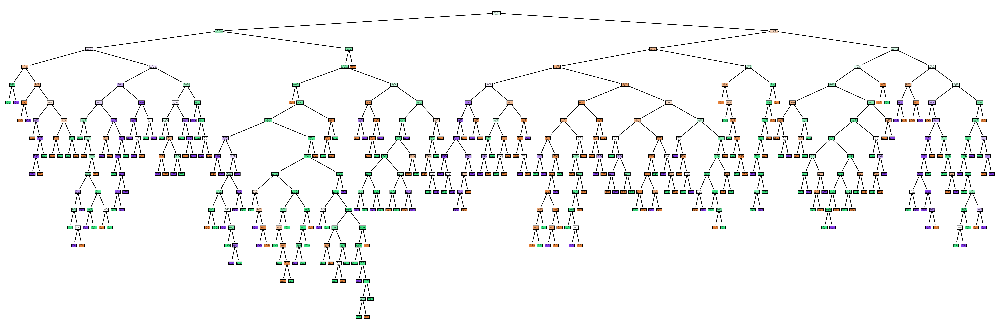

In [132]:
# Visulaization of one decision tree in the random forest models
from sklearn import tree
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (30,10), dpi=500)
tree.plot_tree(final_rfmodel.estimators_[200],feature_names = X_scaled.columns, filled = True, class_names = ["0","1","2"]);
fig.savefig('decision_tree.png')

In [55]:
from dtreeviz.trees import dtreeviz

In [62]:
# Histograms of the three classes based on the selected feature
histogram_three_classes = dtreeviz(final_rfmodel.estimators_[200], 
                                   X_scaled,
                                   y,
                                   target_name = "label",
                                   feature_names = X_scaled.columns,
                                   class_names = ["0","1","2"])  
histogram_three_classes 

# Testing session

In [84]:
test_df = pd.read_csv('test.csv')

In [85]:
X_test = test_df.drop(columns="label")
y_test = test_df["label"]

In [86]:
# Perform PCA on the test dataset
final_pca.fit(X_test)
X_test = final_pca.transform(X_test)
X_test = pd.DataFrame(X_test)

In [133]:
X_test

,0,1,2,3,4,5,6,7,8,9,...,29,30,31,32,33,34,35,36,37,38
0,-5.408820,-0.624860,-1.318555,0.449174,1.216666,0.340602,-0.411096,-0.134990,0.289627,-0.059168,...,-0.409315,-0.182238,0.187591,0.185484,0.309541,0.239274,0.182826,0.113523,-0.283129,-0.381154
1,-4.252446,-0.709325,2.204644,0.207220,-0.487284,0.476918,-2.073373,-0.075597,0.300668,0.000794,...,-0.506295,-0.222957,0.002954,0.326235,-0.195070,0.099468,0.109628,-0.252824,0.094868,-0.096149
2,-5.494267,2.671362,-0.197471,-0.394357,-0.994613,0.305477,-0.455681,-0.405019,-0.760117,0.140593,...,0.178020,-0.004995,0.025138,0.146340,-0.089825,0.583885,0.168166,-0.084927,0.031070,-0.127429
3,-5.449799,-1.109342,0.302694,0.057632,-0.316395,0.264511,0.551940,0.143037,-0.415804,0.191941,...,0.210796,0.088445,-0.197732,0.020692,-0.267076,-0.154511,0.093148,0.079828,-0.038161,0.113977
4,-4.216781,3.871365,0.830343,5.286375,-0.422402,1.266442,-0.382867,-0.490484,-0.031608,0.603875,...,0.529660,0.411161,0.057170,0.327489,-0.191840,-0.283451,-0.212503,-0.399706,0.553264,0.568288
5,-5.007375,-0.737020,1.019283,0.570144,-0.393838,-0.738481,0.998067,0.264930,-0.361872,0.558923,...,0.102048,-0.095564,-0.033842,0.199723,-0.021787,0.215231,0.364549,-0.335972,0.050328,-0.010360
6,-5.471358,-0.437441,-0.387558,-0.425427,0.635883,-0.423408,-0.369183,-0.138762,-0.400984,-0.025610,...,-0.192228,0.171413,-0.289326,-0.034418,-0.078444,-0.216856,0.141768,-0.086461,-0.083753,-0.014848
7,56.360075,-0.020193,-0.072660,-0.016095,-0.065193,-0.037751,-0.002656,-0.028412,-0.005424,-0.003151,...,0.004306,-0.000623,0.002205,0.000888,0.001173,0.001099,-0.002523,-0.001732,-0.000798,-0.001462
8,-5.680278,0.024212,-0.211300,-1.250174,-0.688684,0.969838,-0.364501,-1.030890,-0.089035,0.035327,...,0.237000,-0.250891,0.343939,-0.066768,-0.082989,-0.018708,-0.079950,-0.011264,0.041856,0.163160
9,-5.093003,-0.129873,-0.358811,-0.708570,0.547585,1.028638,-0.595683,0.215309,0.151601,-0.668504,...,0.053007,0.006101,-0.084547,0.158090,0.001802,0.036388,0.231313,-0.152820,0.292225,0.084652


In [89]:
# Fit the random forest model into the test dataset
final_rfmodel.fit(X_test,y_test)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=37, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=600,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [92]:
# Return the result of the prediction
predict = final_rfmodel.predict(X_test)
predict = pd.DataFrame(predict)
predict.columns = ["Predict"]
pd.set_option('display.max_rows', None)
predict

,Predict
0,1
1,0
2,1
3,2
4,0
5,0
6,1
7,0
8,1
9,2
